In [15]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV, Lasso
from sklearn import linear_model 
import matplotlib.pyplot as plt
import numpy as np
from math import *
import os

**LOADING OF THE DATA**

In [10]:
# Loading the data from the files given

X_train = np.load(os.path.abspath('X_train_regression1.npy'))
y_train = np.load(os.path.abspath('y_train_regression1.npy'))
X_test  = np.load(os.path.abspath('X_test_regression1.npy'))

print(np.shape(X_train))

(15, 10)


**PROBLEM 1 - RUDIMENTAR PREDICTION**

In [6]:
# y hat calculation using the formula given in the theory class

Xt       = np.transpose(X_train)
XtX      = np.matmul(Xt,X_train)
inv_XtX  = np.linalg.inv(XtX)
beta_hat = np.matmul(np.matmul(inv_XtX,Xt), y_train)
y_hat    = np.matmul(X_test,beta_hat)

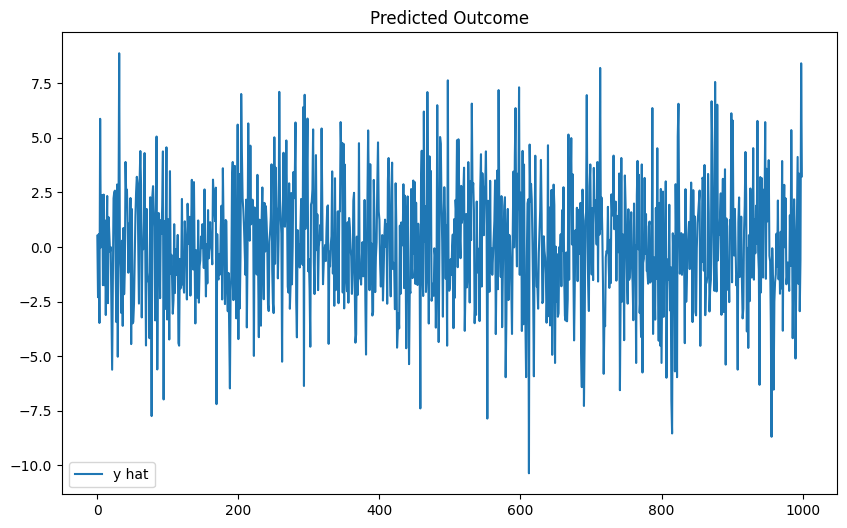

In [7]:
# Plotting the results
plt.figure(figsize=(10,6))
plt.plot(y_hat,label='y hat')

#plt.plot(y_train,label = 'y train'# 
plt.title('Predicted Outcome')
plt.legend()

**REGULARIZATION**

In [9]:
# Centering of the data since we cannot use Regularization methods on uncentered data

X_train_mean  = np.mean(X_train,axis=0) # this is X'
y_train_mean  = np.mean(y_train,axis=0)
X_test_mean   = np.mean(X_test,axis=0) #nao sei se concordo

X_train_prime = X_train.copy()
y_train_prime = y_train.copy()
X_test_prime  = X_test.copy()

for i in range(10):
    X_train_prime[:,i] = X_train_prime[:,i] -  X_train_mean[i]
    X_test_prime[:,i]  = X_test_prime[:,i]  -  X_test_mean[i] 

# y_train_prime is a one dimensional array, and as such we don't include it in the for loop 

y_train_prime = y_train_prime -  y_train_mean 


[[ 0.97944888  0.40699274 -0.37216774  0.06515514 -0.63079988 -1.0563022
  -1.92362878  0.54214261  0.03896113 -1.11701672]
 [-0.26561127  0.64806636  0.25696277 -1.09477292 -1.3989377   1.13579511
   1.0548696  -0.72956217  1.84105625 -1.69438106]
 [-0.54837272 -0.16447986  0.81072607 -1.06941183 -0.38175159 -0.73378422
  -0.39888904  1.14778468  0.53314397  1.73216042]
 [-0.09626796  0.81151461 -0.3401383   0.21657304  1.74636013  0.11314149
  -0.09827168 -0.1773942  -1.25702273  0.10334682]
 [-1.38067087  0.40834939 -1.31863872 -0.77263426 -0.1241566   0.38302958
  -0.88138889  1.11707251 -1.28904996 -0.30514985]
 [-0.72837104 -1.29008858 -2.10917246 -0.83085695  0.16236785  0.47102185
  -0.88723589 -0.37181692 -1.08027337  1.74711743]
 [ 1.88600201  0.96371032  0.30655672  0.96197556  0.7488291   2.43548358
   0.76507757  0.32878564  1.32267052  0.13800383]
 [-2.94138589  0.65255329 -0.78881525 -0.94596841 -0.0506776   1.17564066
  -0.43773996  1.58677239 -0.83703776  0.67957131]
 

LASSO

Notas: Não esquecer de dar scale das variaveis
testar com o gridsearch CV e com o LassoCV e ver o que dá melhor valor
LassoCV é mais rápido

In [ ]:
# the value that gave the highest R^2 is cv=3

model = LassoCV(alphas=np.arange(0,10,0.01),cv=3,random_state=0).fit(X_train_prime,y_train_prime) 

selected_features_lasso = np.flatnonzero(model.coef_) # features that model kept 
X_train_prime_mod = X_train_prime[:,selected_features_lasso].copy()
# model.score(X_train_prime,y_train_prime) # measurement of the R^2 coefficient of the model 


# y hat calculation using the formula given in the theory class

Xt_lasso              = np.transpose(X_train_prime_mod)
XtX_lasso             = np.matmul(Xt_lasso,X_train_prime_mod)
inv_XtX_lasso         = np.linalg.inv(XtX_lasso)
beta_hat_prime_lasso  = np.matmul(np.matmul(inv_XtX_lasso,Xt_lasso), y_train_prime)
beta_zero_prime_lasso = y_train_mean - np.matmul(np.transpose(X_train_mean[selected_features_lasso]),beta_hat_prime_lasso)

m = [beta_zero_prime_lasso]
for k in range(len(selected_features_lasso)):
    m.append(beta_hat_prime_lasso[k,:])
beta_hat_lasso = np.array(m)

# Prediciton using the lasso model

ones = np.ones((1000,1))
X_test_lasso = np.hstack((ones,X_test[:,selected_features_lasso]))

y_hat_lasso = np.matmul(X_test_lasso,beta_hat_lasso)

In [29]:
np.arange(0,10,0.01)

array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
       0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
       0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
       0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54,
       0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65,
       0.66, 0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76,
       0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87,
       0.88, 0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98,
       0.99, 1.  , 1.01, 1.02, 1.03, 1.04, 1.05, 1.06, 1.07, 1.08, 1.09,
       1.1 , 1.11, 1.12, 1.13, 1.14, 1.15, 1.16, 1.17, 1.18, 1.19, 1.2 ,
       1.21, 1.22, 1.23, 1.24, 1.25, 1.26, 1.27, 1.28, 1.29, 1.3 , 1.31,
       1.32, 1.33, 1.34, 1.35, 1.36, 1.37, 1.38, 1.39, 1.4 , 1.41, 1.42,
       1.43, 1.44, 1.45, 1.46, 1.47, 1.48, 1.49, 1.

In [125]:
# NOT REMOVING COLUMNS + LASSOCV
# y hat calculation using the formula given in the theory class

beta_hat_prime_lasso2  = model.coef_
beta_zero_prime_lasso2 = y_train_mean - np.matmul(np.transpose(X_train_mean),beta_hat_prime_lasso2)
m = [beta_zero_prime_lasso2[0]]
for k in range(len(beta_hat_prime_lasso2)):
    m.append(beta_hat_prime_lasso2[k])
beta_hat_lasso2 = np.array(m)

# Prediciton using the lasso model

ones = np.ones((1000,1))
X_test_lasso2 = np.hstack((ones,X_test))
y_hat_lasso2 = np.matmul(X_test_lasso2,beta_hat_lasso2)

In [ ]:
# NOT REMOVING COLUMNS + GRIDSEARCHCV
params = {'alpha': (np.arange(0,5,0.01))}
modelLasso = Lasso()
lasso_model = GridSearchCV(modelLasso, params, scoring='neg_mean_squared_error', cv = 5).fit(X_train_prime, y_train_prime)
modelGrid = Lasso(alpha = lasso_model.best_params_['alpha']).fit(X_train_prime,y_train_prime)
#print(lasso_model.best_score_)
#print(modelGrid.coef_)


# y hat calculation using the formula given in the theory class

beta_hat_prime_lasso3  = modelGrid.coef_
beta_zero_prime_lasso3 = y_train_mean - np.matmul(np.transpose(X_train_mean),beta_hat_prime_lasso3)
m = [beta_zero_prime_lasso3[0]]
for k in range(len(beta_hat_prime_lasso3)):
    m.append(beta_hat_prime_lasso3[k])
beta_hat_lasso3 = np.array(m)

# Prediciton using the lasso model

ones = np.ones((1000,1))
X_test_lasso3 = np.hstack((ones,X_test))
y_hat_lasso3 = np.matmul(X_test_lasso3,beta_hat_lasso3)

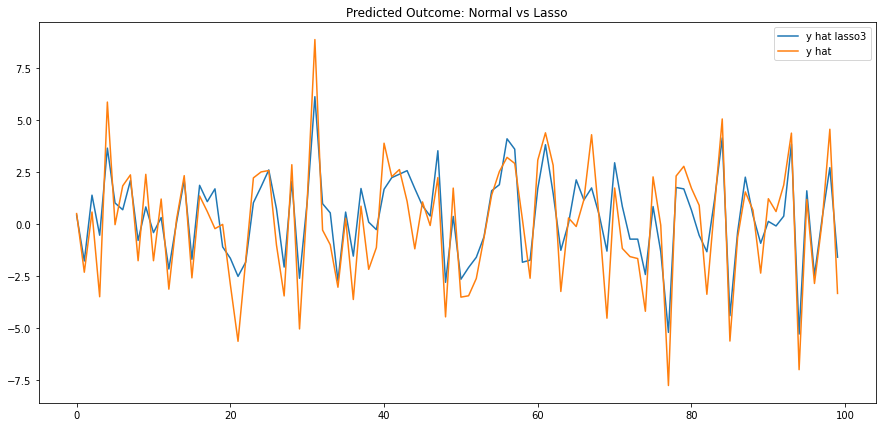

In [138]:
# Plotting the results
plt.figure(figsize=(15,7))
#plt.plot(y_hat_lasso[0:100],label='y hat lasso')
#plt.plot(y_hat_lasso2[0:100],label='y hat lasso2')
plt.plot(y_hat_lasso3[0:100],label='y hat lasso3')
plt.plot(y_hat[0:100],label='y hat')

#plt.plot(y_train,label = 'y train'# 
plt.title('Predicted Outcome: Normal vs Lasso')
plt.legend()

In [ ]:
from sklearn.preprocessing import StandardScaler
X_traine = X_train[0:13,:]
X_teste = X_train[13:15,:]

scaler = StandardScaler().fit(X_traine) 

X_traine = scaler.transform(X_traine)
X_teste = scaler.transform(X_teste)
# Centering of the data since we cannot use Regularization methods on uncentered data

X_train_mean  = np.mean(X_traine,axis=0) # this is X'
y_train_mean  = np.mean(y_train,axis=0)

X_train_prime = X_traine.copy()
y_train_prime = y_train.copy()
X_test_prime  = X_teste.copy()

for i in range(10):
    X_train_prime[:,i] = X_train_prime[:,i] -  X_train_mean[i]
    X_test_prime[:,i]  = X_test_prime[:,i]  -  X_test_mean[i] 

# y_train_prime is a one dimensional array, and as such we don't include it in the for loop 

y_train_prime = y_train_prime -  y_train_mean

# LASSO 2 

model = LassoCV(alphas=np.arange(0,10,0.01),cv=6,random_state=0).fit(X_train_prime[0:13,:],y_train_prime[0:13,:]) 
beta_hat_prime_lasso2  = model.coef_
beta_zero_prime_lasso2 = y_train_mean[0:13] - np.matmul(np.transpose(X_train_mean[0:13]),beta_hat_prime_lasso2)
m = [beta_zero_prime_lasso2[0]]
for k in range(len(beta_hat_prime_lasso2)):
    m.append(beta_hat_prime_lasso2[k])
beta_hat_lasso5 = np.array(m)

# Prediciton using the lasso model

# Prediciton using the lasso model
ones = np.ones((2,1))
X = np.hstack((ones,X_teste))
y_prediciton = np.matmul(X, beta_hat_lasso5)
y_val = y_train[13:15]
sse = 0 
for n in range(2):
    sse = sse + (y_prediciton[n]-y_val[n][0])**2
sse

In [209]:
### Prediction for X_test

scaler = StandardScaler().fit(X_traine) 

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# Centering of the data since we cannot use Regularization methods on uncentered data

X_train_mean  = np.mean(X_train,axis=0) # this is X'
y_train_mean  = np.mean(y_train,axis=0)
X_test_mean   = np.mean(X_test,axis=0)

X_train_prime = X_train.copy()
y_train_prime = y_train.copy()
X_test_prime  = X_test.copy()

for i in range(10):
    X_train_prime[:,i] = X_train_prime[:,i] -  X_train_mean[i]
    X_test_prime[:,i]  = X_test_prime[:,i]  -  X_test_mean[i] 

# y_train_prime is a one dimensional array, and as such we don't include it in the for loop 

y_train_prime = y_train_prime -  y_train_mean 

# LASSO 2 
# NOT REMOVING COLUMNS + LASSOCV
# y hat calculation using the formula given in the theory class

model = LassoCV(alphas=np.arange(0,10,0.01),cv=6,random_state=0).fit(X_train_prime,y_train_prime) 

beta_hat_prime_lasso2  = model.coef_
beta_zero_prime_lasso2 = y_train_mean - np.matmul(np.transpose(X_train_mean),beta_hat_prime_lasso2)
m = [beta_zero_prime_lasso2[0]]
for k in range(len(beta_hat_prime_lasso2)):
    m.append(beta_hat_prime_lasso2[k])
beta_hat_lasso2 = np.array(m)

# Prediciton using the lasso model
ones = np.ones((1000,1))
X_test_lasso2 = np.hstack((ones,X_test))
y_hat_lasso2 = np.matmul(X_test_lasso2,beta_hat_lasso2)

c:\Users\rodol\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\rodol\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\rodol\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0707889559085686, tolerance: 0.006731599188269994
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\rodol\AppData\Local\Prog

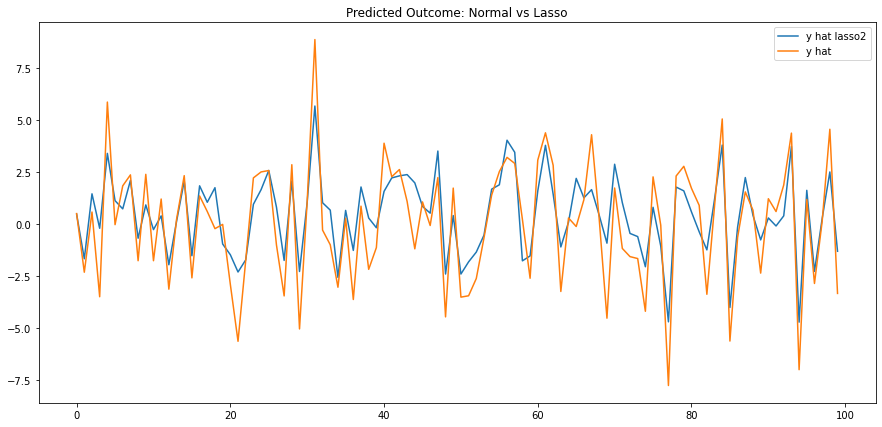

In [210]:
# Plotting the results
plt.figure(figsize=(15,7))
#plt.plot(y_hat_lasso[0:100],label='y hat lasso')
plt.plot(y_hat_lasso2[0:100],label='y hat lasso2')
plt.plot(y_hat[0:100],label='y hat')

plt.title('Predicted Outcome: Normal vs Lasso')
plt.legend()



In [101]:
# Benchmarking the normal equations procedure 
from sklearn.preprocessing import StandardScaler
X_traine = X_train[0:13,:]
X_teste = X_train[13:15,:]

scaler = StandardScaler().fit(X_traine) 

X_traine = scaler.transform(X_traine)
X_teste = scaler.transform(X_teste)

Xt       = np.transpose(X_traine)
XtX      = np.matmul(Xt,X_traine)
inv_XtX  = np.linalg.inv(XtX)
beta_hat = np.matmul(np.matmul(inv_XtX,Xt), y_train[0:13])
y_hat    = np.matmul(X_teste,beta_hat)

y_val = y_train[13:15]
sse = 0 
for n in range(2):
    sse = sse + (y_hat[n]-y_val[n][0])**2
sse[0]

61.59864522729553

RIDGE


In [14]:
Xt_prime       = np.transpose(X_train_prime)
XtX_prime      = np.matmul(Xt_prime,X_train_prime)
Y_hypperparameter =1
Y_hyperparameter_ridge = np.identity(np.shape(Xt_prime)[0])*Y_hypperparameter


inv_XtX_yI  = np.linalg.inv(XtX_prime + Y_hyperparameter_ridge)
beta_hat_rigde = np.matmul(np.matmul(inv_XtX_yI,Xt_prime), y_train_prime)




Scikit ridge cv - sem data centrada

In [47]:
reg = linear_model.RidgeCV(alphas=np.arange(0.01,10,0.01)).fit(X_train, y_train)

print("Hiperparametor lameda dos slides  " + str(reg.alpha_))
print("B^1 =" +str(reg.coef_))
print("B^0 = " + str(reg.intercept_))
print("R^2 =" + str(reg.score(X_train, y_train)))




Hiperparametor lameda dos slides  2.4
B^1 =[[-0.01007212 -0.53800143  0.72998949 -0.27018097  0.19889648  1.2090262
  -0.59113814  0.13615133  0.3819578   0.55343922]]
B^0 = [0.59837202]
R^2 =0.8907054330469559


In [1]:
print('hello')

hello


Scikit ridge cv - com data centrada

In [87]:
reg = linear_model.RidgeCV(alphas=np.arange(0.01,10,0.01), fit_intercept=False, cv=None,store_cv_values=True ).fit(X_train_prime, y_train_prime)
print("Hiperparametor lameda dos slides  " + str(reg.alpha_))
beta_hat_ridge_cvLeaveOneOut = reg.coef_
print("B^1 =" +str(reg.coef_))
print("B^0 = " + str(reg.intercept_))
print("R^2 =" + str(reg.score(X_train_prime, y_train_prime)))



Hiperparametor lameda dos slides  1.31
B^1 =[[-0.0599462  -0.50136074  0.81990349 -0.23942806  0.18658551  1.35812205
  -0.77310107  0.0800601   0.42731925  0.6029222 ]]
B^0 = 0.0
R^2 =0.9110720392893541


Scikit ridge cv - com data centrada - verificar os valores de CV

In [49]:
reg = linear_model.RidgeCV(alphas=np.arange(0.01,10,0.01), fit_intercept=False, cv=3).fit(X_train_prime, y_train_prime)
print("Hiperparametor lameda dos slides  " + str(reg.alpha_))
print("B^1 =" +str(reg.coef_))
print("B^0 = " + str(reg.intercept_))
print("R^2 =" + str(reg.score(X_train_prime, y_train_prime)))
#print(reg.cv_values_)

Hiperparametor lameda dos slides  6.88
B^1 =[[ 0.00865715 -0.49168532  0.54201777 -0.25501111  0.20742297  0.88035724
  -0.29633215  0.19650743  0.29997217  0.45292037]]
B^0 = 0.0
R^2 =0.8082377701283134


In [90]:
reg = linear_model.RidgeCV(alphas=np.arange(0.01,10,0.01), fit_intercept=False, cv=5).fit(X_train_prime, y_train_prime)
print("Hiperparametor lameda dos slides  " + str(reg.alpha_))
beta_hat_ridge_cv5 = reg.coef_
print("B^1 =" +str(reg.coef_))
print("B^0 = " + str(reg.intercept_))
print("R^2 =" + str(reg.score(X_train_prime, y_train_prime)))


Hiperparametor lameda dos slides  5.9799999999999995
B^1 =[[ 0.01094436 -0.50680399  0.56823608 -0.26195411  0.20872007  0.92736214
  -0.33130666  0.19242678  0.31281047  0.46821127]]
B^0 = 0.0
R^2 =0.8242128634861228


Otimizar valor de CV:

In [83]:

cv_lameda_R = []
for cv_value in np.arange(2,14,1):
    reg = linear_model.RidgeCV(alphas=np.arange(0.01,10,0.01), fit_intercept=False, cv=cv_value).fit(X_train_prime, y_train_prime)
    cv_lameda_R.append([ cv_value , reg.alpha_, reg.score(X_train_prime, y_train_prime)])
cv_lameda_R
#print("Hiperparametor lameda dos slides  " + str(reg.alpha_))
#print("B^1 =" +str(reg.coef_))
#print("B^0 = " + str(reg.intercept_))
#print("R^2 =" + str(reg.score(X_train_prime, y_train_prime)))
#print(reg.cv_values_)

C:\Users\alexa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\alexa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\alexa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\alexa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\Local

[[2, 9.99, 0.7562892558513439],
 [3, 6.88, 0.8082377701283134],
 [4, 6.58, 0.813519127889462],
 [5, 5.9799999999999995, 0.8242128634861228],
 [6, 9.99, 0.7562892558513439],
 [7, 9.99, 0.7562892558513439],
 [8, 0.01, 0.9300445467775543],
 [9, 0.01, 0.9300445467775543],
 [10, 0.01, 0.9300445467775543],
 [11, 0.01, 0.9300445467775543],
 [12, 0.01, 0.9300445467775543],
 [13, 0.01, 0.9300445467775543]]

Do codigo acima concluimos que cv= 5, com Lameda (ou alpha)=5.98 produz o melhor R2, sendo que também convém experimentar e ver o SSE de cv=8, alpha=0,01 pq o R^2 dá mais alto(mas é um valor estranho já que fica constante ao longo dos cvs)
Para além disto, da secção "Scikit ridge cv - com data centrada" - encontramos um alpha= 1,31 e R^2 =0.9110720392893541, para cv=None o que corresponde a usar o método leave one out - que será mais efeciente segundo o scikit learn

Vamos prosseguir, calculando os valores de y_teste para cada uma destas trÊs opções e calculando o respetivo SSE

Ridge cv=5 com data centrada - isto é - sem Beta0

In [95]:
#print(np.shape(X_test))
#print(np.shape(beta_hat_ridge_cv5))
y_hat_ridge_cv5 = np.matmul(X_test,np.transpose(beta_hat_ridge_cv5)) #aqui tenho duvidas se usamos [1 Xt ]Beta ou X*Beta, mas acho que é assim uma vez que não temos B0


(1000, 10)
(1, 10)


Ridge cv=8

In [99]:
reg = linear_model.RidgeCV(alphas=np.arange(0.01,10,0.01), fit_intercept=False, cv=8).fit(X_train_prime, y_train_prime)
beta_hat_ridge_cv8 = reg.coef_
y_hat_ridge_cv8 = np.matmul(X_test,np.transpose(beta_hat_ridge_cv8)) 

C:\Users\alexa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\alexa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\alexa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\alexa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\Local

Ridge leave one  out


In [98]:
y_hat_ridge_cvLeaveOneOut = np.matmul(X_test,np.transpose(beta_hat_ridge_cvLeaveOneOut)) 

In [107]:

y_hat_ridge = np.matmul(X_test,beta_hat_rigde)  #ridge calculado matricialmente

Vamos agora comparar estas opções a nível gráfico

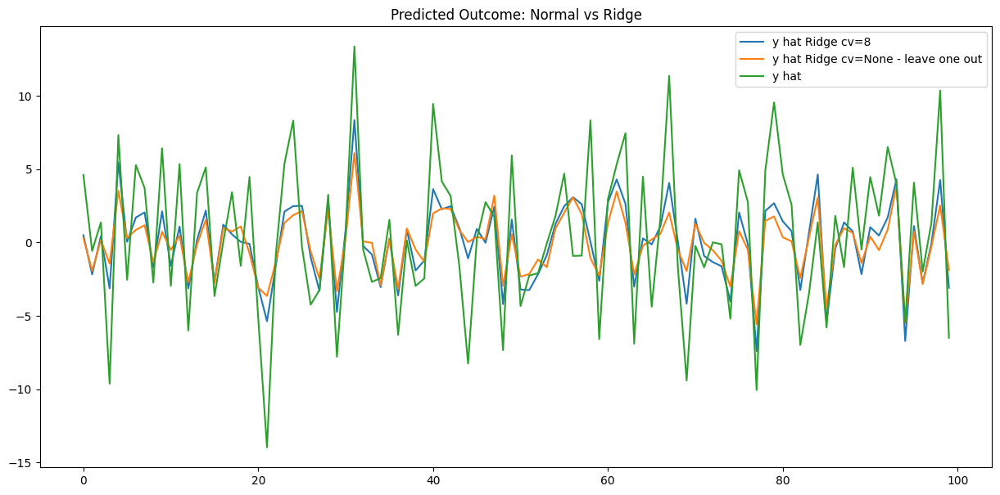

In [112]:
# Plotting the results
plt.figure(figsize=(15,7))
#plt.plot(y_hat_ridge_cv5[0:100],label='y hat Ridge cv=5')
plt.plot(y_hat_ridge_cv8[0:100],label='y hat Ridge cv=8')
plt.plot(y_hat_ridge_cvLeaveOneOut[0:100],label='y hat Ridge cv=None - leave one out')
#plt.plot(y_hat_ridge[0:100],label='y hat Ridge sem cv')
y_hat    = np.matmul(X_test,beta_hat)
plt.plot(y_hat[0:100],label='y hat')

plt.title('Predicted Outcome: Normal vs Ridge')
plt.legend()


**Relemebrando**

cv= 5, com Lameda (ou alpha)=5.98 produz o melhor R2=0.8242128634861228, 
cv=8, alpha=0,01 pq o R^2=  0.9300445467775543 (mas é um valor estranho já que fica constante ao longo dos cvs)
"Scikit ridge cv - com data centrada" - encontramos um alpha= 1,31 e R^2 =0.9110720392893541,